# Problem Statement



Using Machine Learning To Predict Diagnosis of a Breast Cancer

1. Identify the problem

Breast cancer is the most common malignancy among women, accounting for nearly 1 in 3 cancers diagnosed among women in the United States, and it is the second leading cause of cancer death among women. Breast Cancer occurs as a results of abnormal growth of cells in the breast tissue, commonly referred to as a Tumor. A tumor does not mean cancer - tumors can be benign (not cancerous), pre-malignant (pre-cancerous), or malignant (cancerous). Tests such as MRI, mammogram, ultrasound and biopsy are commonly used to diagnose breast cancer performed.

1.1 Expected outcome

Given breast cancer results from breast fine needle aspiration (FNA) test (is a quick and simple procedure to perform, which removes some fluid or cells from a breast lesion or cyst (a lump, sore or swelling) with a fine needle similar to a blood sample needle). Since this build a model that can classify a breast cancer tumor using two training classification:

1= Malignant (Cancerous) - Present
0= Benign (Not Cancerous) -Absent

1.2 Objective

Since the labels in the data are discrete, the predication falls into two categories, (i.e. Malignant or benign). In machine learning this is a classification problem.

Thus, the goal is to classify whether the breast cancer is benign or malignant and predict the recurrence and non-recurrence of malignant cases after a certain period. To achieve this we have used machine learning classification methods to fit a function that can predict the discrete class of new input.

1.3 Identify data sources

The Breast Cancer datasets is available machine learning repository maintained by the University of California, Irvine. The dataset contains 569 samples of malignant and benign tumor cells.

The first two columns in the dataset store the unique ID numbers of the samples and the corresponding diagnosis (M=malignant, B=benign), respectively.
The columns 3-32 contain 30 real-value features that have been computed from digitized images of the cell nuclei, which can be used to build a model to predict whether a tumor is benign or malignant.






# Solution:-

In [516]:
#import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
import sklearn
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score,classification_report, confusion_matrix
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, RandomizedSearchCV

In [517]:
#import dataset
df=pd.read_csv("Cancer Dataset.csv")

In [518]:
df.head(5)

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


# EDA(Exploratory Data Analysis)

In [519]:
df.shape

(569, 32)

In the cancer dataset we have 569 rows and 32 columns

In [520]:
#Checking Columns name
df.columns

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

In [521]:
#As the number of columns is very large we cannot see the data of all the columns but we can see all the data by dividing the data set into 4 parts.
print(df.head(10).iloc[:,0:8])

print("-"*80)

print(df.head(10).iloc[:,8:16])

print("-"*80)

print(df.head(20).iloc[:,16:24])

print("-"*80)

print(df.head(20).iloc[:,24:32])

print("-"*80)

         id diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
0    842302         M        17.99         10.38          122.80     1001.0   
1    842517         M        20.57         17.77          132.90     1326.0   
2  84300903         M        19.69         21.25          130.00     1203.0   
3  84348301         M        11.42         20.38           77.58      386.1   
4  84358402         M        20.29         14.34          135.10     1297.0   
5    843786         M        12.45         15.70           82.57      477.1   
6    844359         M        18.25         19.98          119.60     1040.0   
7  84458202         M        13.71         20.83           90.20      577.9   
8    844981         M        13.00         21.82           87.50      519.8   
9  84501001         M        12.46         24.04           83.97      475.9   

   smoothness_mean  compactness_mean  
0          0.11840           0.27760  
1          0.08474           0.07864  
2          0.

In [522]:
# Checking columns datatype information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

We can see the data type of all columns except ID and Diagnosis is float type

In [523]:
#checking null values
df.isnull().sum()

id                         0
diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

 There are no missing values in the data set                              

In [524]:
#Checking the mean std min max of each numerical column in the data set
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,569.0,3.037183e+07,1.250206e+08,8670.000000,869218.000000,906024.000000,8.813129e+06,9.113205e+08
radius_mean,569.0,1.412729e+01,3.524049e+00,6.981000,11.700000,13.370000,1.578000e+01,2.811000e+01
texture_mean,569.0,1.928965e+01,4.301036e+00,9.710000,16.170000,18.840000,2.180000e+01,3.928000e+01
perimeter_mean,569.0,9.196903e+01,2.429898e+01,43.790000,75.170000,86.240000,1.041000e+02,1.885000e+02
area_mean,569.0,6.548891e+02,3.519141e+02,143.500000,420.300000,551.100000,7.827000e+02,2.501000e+03
smoothness_mean,569.0,9.636028e-02,1.406413e-02,0.052630,0.086370,0.095870,1.053000e-01,1.634000e-01
compactness_mean,569.0,1.043410e-01,5.281276e-02,0.019380,0.064920,0.092630,1.304000e-01,3.454000e-01
concavity_mean,569.0,8.879932e-02,7.971981e-02,0.000000,0.029560,0.061540,1.307000e-01,4.268000e-01
concave points_mean,569.0,4.891915e-02,3.880284e-02,0.000000,0.020310,0.033500,7.400000e-02,2.012000e-01
symmetry_mean,569.0,1.811619e-01,2.741428e-02,0.106000,0.161900,0.179200,1.957000e-01,3.040000e-01


Now we examine each column of the data set and plot some graphs to find some information

In [541]:
print(df.columns[0],'\n')
df[df.columns[0]]

id 



0        842302
1        842517
2      84300903
3      84348301
4      84358402
         ...   
564      926424
565      926682
566      926954
567      927241
568       92751
Name: id, Length: 569, dtype: int64

In [542]:
df[df.columns[0]].nunique()

569

In [543]:
#Since id columns represent the unique identity of each person in the data set, we delete this column from the data set
df_new = df.drop(["id"], axis=1)

In [544]:
df_new.sample(2)

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
512,M,13.40,20.52,88.64,556.7,0.11060,0.1469,0.14450,0.08172,0.2116,...,16.41,29.66,113.30,844.4,0.1574,0.3856,0.5106,0.2051,0.3585,0.1109
204,B,12.47,18.60,81.09,481.9,0.09965,0.1058,0.08005,0.03821,0.1925,...,14.97,24.64,96.05,677.9,0.1426,0.2378,0.2671,0.1015,0.3014,0.0875


In [545]:
print(df.columns[1],'\n')
df[df.columns[1]]

diagnosis 



0      M
1      M
2      M
3      M
4      M
      ..
564    M
565    M
566    M
567    M
568    B
Name: diagnosis, Length: 569, dtype: object

B    357
M    212
Name: diagnosis, dtype: int64


<AxesSubplot:xlabel='diagnosis', ylabel='Count'>

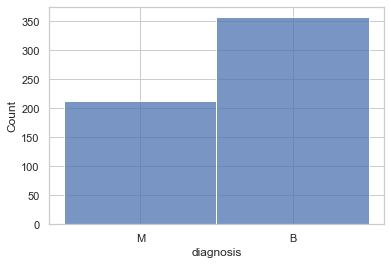

In [546]:
print(df[df.columns[1]].value_counts())
sns.histplot(data=df, x="diagnosis", legend=True)

This is our target column and we can see in this column the number of malignant data is 357 and the number of benign data is 212.

In [547]:
print(df.columns[2],'\n')
df[df.columns[2]]

radius_mean 



0      17.99
1      20.57
2      19.69
3      11.42
4      20.29
       ...  
564    21.56
565    20.13
566    16.60
567    20.60
568     7.76
Name: radius_mean, Length: 569, dtype: float64

In [548]:
# now checking for numerical columns
numerical_columns=[]
index_n=[]
m=0
for i in df.dtypes.index:
    if df.dtypes[i]!='object':
        numerical_columns.append(i)
        index_n.append(m)
    m=m+1
print(numerical_columns)
print(index_n)

['id', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst']
[0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31]


In [549]:
len(index_n)

31

In [550]:
del index_n[0] 

In [551]:
index_n

[2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31]

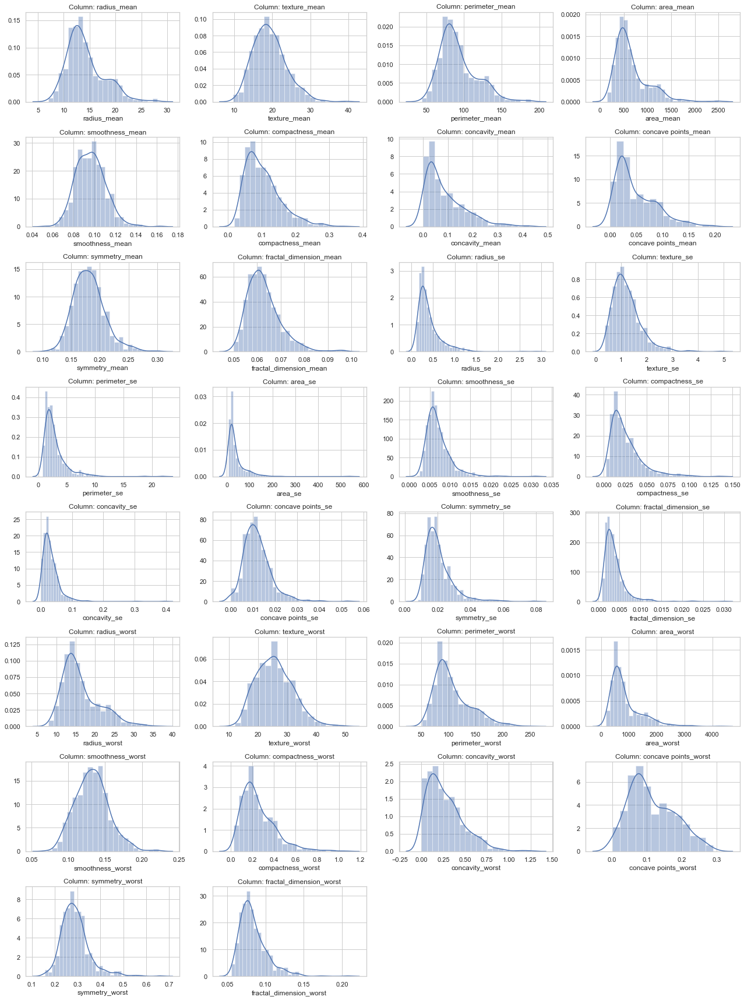

In [380]:
import warnings 
warnings.filterwarnings('ignore')


num_plots = len(index_n)

num_rows = 8
num_columns = 4

# Create subplots with the specified number of rows and columns
fig, axes = plt.subplots(num_rows, num_columns, figsize=(18, 24))

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Loop through the indices and create subplots
for i in range(num_plots):
    ax = axes[i]
    column_index = index_n[i]
    

    # Create a distribution plot (histogram)
    sns.distplot(df[df.columns[column_index]], ax=ax)
    
    # Set subplot title
    ax.set_title("Column: " + df.columns[column_index])
    
    # Remove y-axis label
    ax.set_ylabel("")
    
    # Add some space between subplots
    fig.tight_layout()

# Hide any remaining empty subplots
for i in range(num_plots, num_rows * num_columns):
    fig.delaxes(axes[i])

# Show the subplots
plt.show()


We can see from the distribution plots of numerical columns that many of them are leaning towards the right, which means they have a longer tail on the right side. Now, we want to measure and show exactly how much this leaning to the right occurs in each column using #df.skew()

In [552]:
#Checking Skewness
df.skew()

id                         6.473752
radius_mean                0.942380
texture_mean               0.650450
perimeter_mean             0.990650
area_mean                  1.645732
smoothness_mean            0.456324
compactness_mean           1.190123
concavity_mean             1.401180
concave points_mean        1.171180
symmetry_mean              0.725609
fractal_dimension_mean     1.304489
radius_se                  3.088612
texture_se                 1.646444
perimeter_se               3.443615
area_se                    5.447186
smoothness_se              2.314450
compactness_se             1.902221
concavity_se               5.110463
concave points_se          1.444678
symmetry_se                2.195133
fractal_dimension_se       3.923969
radius_worst               1.103115
texture_worst              0.498321
perimeter_worst            1.128164
area_worst                 1.859373
smoothness_worst           0.415426
compactness_worst          1.473555
concavity_worst            1

Many columns represent skewness. We identify the columns that present skewness above 0.5 and store them in a list to apply the skewness removal technique.

In [553]:
threshhold=0.5
skewness = df.skew()
skewed_columns = []

for column in skewness.index:
    if abs(skewness[column]) > 0.5 :
        skewed_columns.append(column)
        print(column)

id
radius_mean
texture_mean
perimeter_mean
area_mean
compactness_mean
concavity_mean
concave points_mean
symmetry_mean
fractal_dimension_mean
radius_se
texture_se
perimeter_se
area_se
smoothness_se
compactness_se
concavity_se
concave points_se
symmetry_se
fractal_dimension_se
radius_worst
perimeter_worst
area_worst
compactness_worst
concavity_worst
symmetry_worst
fractal_dimension_worst


#Applying Logarithim transformation to remove skewness
import numpy as np
del skewed_columns[0]
for i in skewed_columns:
    df_new[i] = np.log1p(df_new[i])

df_new.skew()

There is still skewness, ignore it now that we will handle it before applying machine learning

In [554]:
df

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [555]:
df.columns

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

# Scatter Plots with Target Variable:

Explore the relationship between numeric features and the target variable.

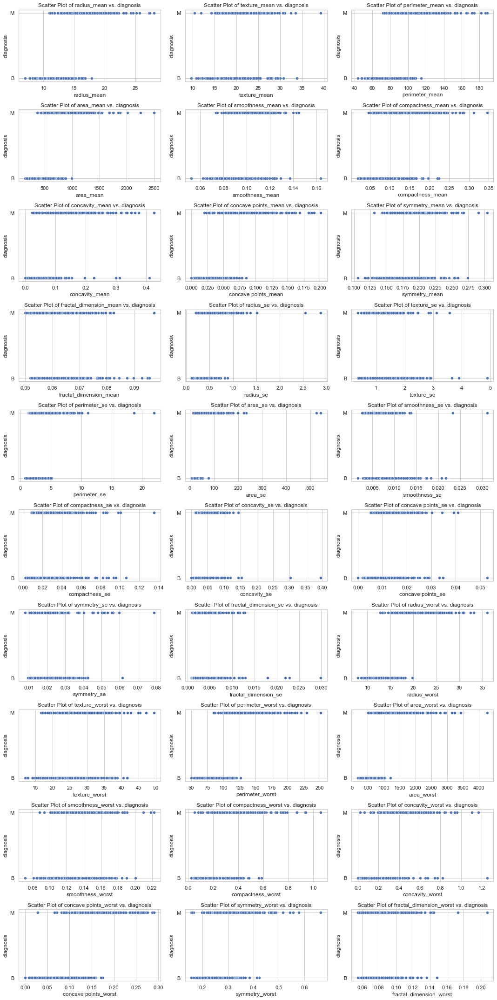

In [576]:
import warnings 
warnings.filterwarnings('ignore')


num_plots = len(index_n)

num_rows = 10
num_columns = 3

# Create subplots with the specified number of rows and columns
fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 30))

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Loop through the indices and create subplots
for i in range(num_plots):
    ax = axes[i]
    column_index = index_n[i]
    
    sns.scatterplot(x=df[df.columns[column_index]], y=df['diagnosis'], ax=ax)
    
    # Set subplot title
    ax.set_title(f'Scatter Plot of {df.columns[column_index]} vs. diagnosis')
    
    ax.set_ylabel("diagnosis")
    
    # Add some space between subplots
    fig.tight_layout()

# Hide any remaining empty subplots
for i in range(num_plots, num_rows * num_columns):
    fig.delaxes(axes[i])

# Show the subplots
plt.show()


# Violin Plots:

Visualize the distribution of numeric features by target class

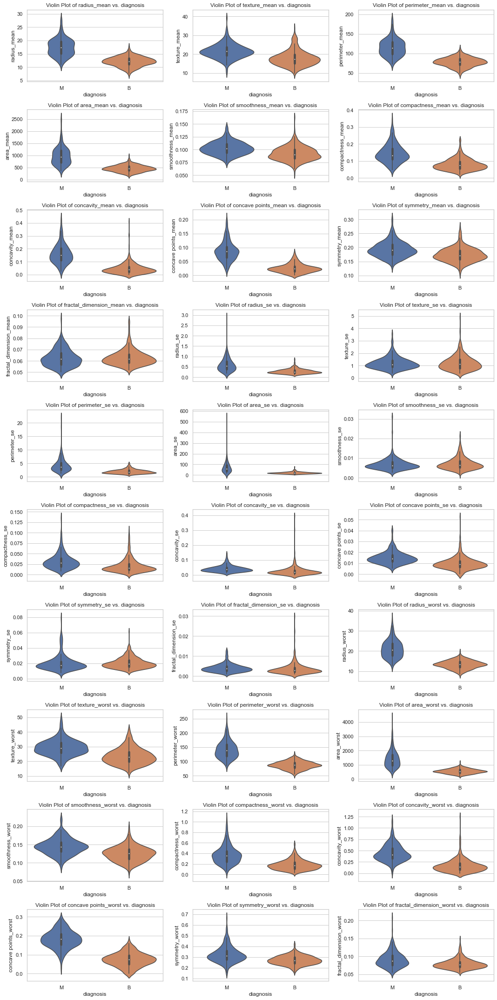

In [570]:
import warnings 
warnings.filterwarnings('ignore')


num_plots = len(index_n)

num_rows = 10
num_columns = 3

# Create subplots with the specified number of rows and columns
fig, axes = plt.subplots(num_rows, num_columns, figsize=(15,30))

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Loop through the indices and create subplots
for i in range(num_plots):
    ax = axes[i]
    column_index = index_n[i]
    
    sns.violinplot(y=df[df.columns[column_index]], x=df['diagnosis'],ax=ax)
    
    ax.set_title(f'Violin Plot of {df.columns[column_index]} vs. diagnosis')
    
    ax.set_ylabel(df.columns[column_index])
    
    # Add some space between subplots
    fig.tight_layout()

# Hide any remaining empty subplots
for i in range(num_plots, num_rows * num_columns):
    fig.delaxes(axes[i])

# Show the subplots
plt.show()


# Bar Plot for Binary Target vs. Numeric Feature:

Explore the mean value of numeric features for each class of the binary target.

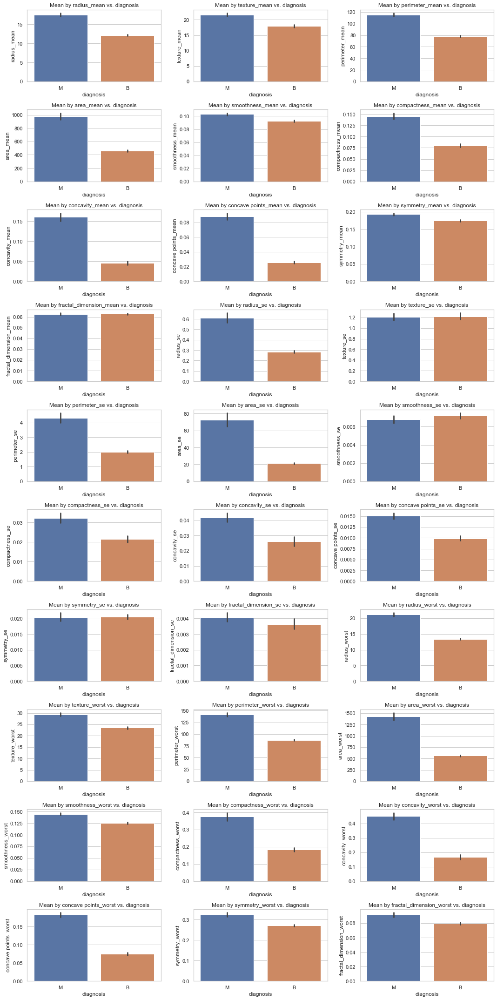

In [574]:
import warnings 
warnings.filterwarnings('ignore')


num_plots = len(index_n)

num_rows = 10
num_columns = 3

# Create subplots with the specified number of rows and columns
fig, axes = plt.subplots(num_rows, num_columns, figsize=(15,30))

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Loop through the indices and create subplots
for i in range(num_plots):
    ax = axes[i]
    column_index = index_n[i]
    

    
    sns.barplot(y=df[df.columns[column_index]], x=df['diagnosis'], ax=ax)
    
    # Set subplot title
    ax.set_title(f'Mean by {df.columns[column_index]} vs. diagnosis')
    
    ax.set_ylabel(df.columns[column_index])
    
    # Add some space between subplots
    fig.tight_layout()

# Hide any remaining empty subplots
for i in range(num_plots, num_rows * num_columns):
    fig.delaxes(axes[i])

# Show the subplots
plt.show()


# Swarm Plot:

In [538]:
#Visualize the distribution of numeric features while showing individual data points.

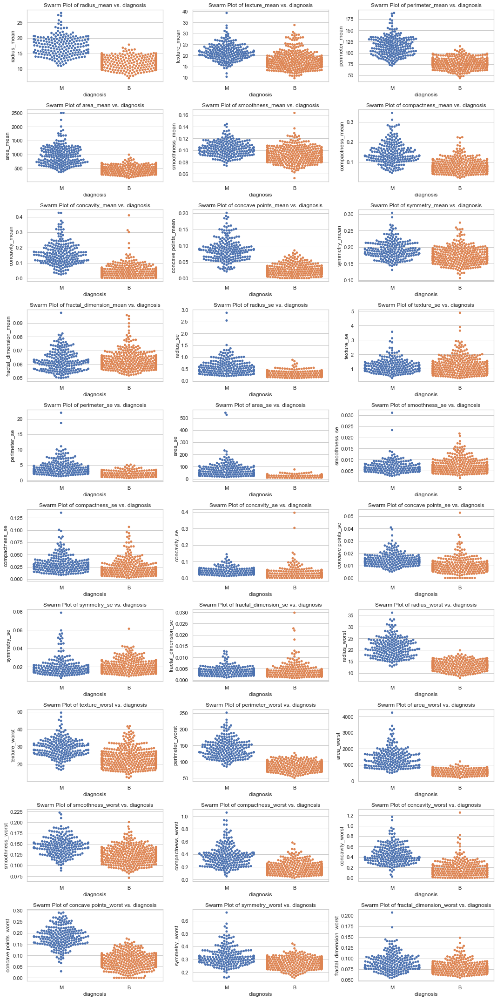

In [575]:
import warnings 
warnings.filterwarnings('ignore')


num_plots = len(index_n)

num_rows = 10
num_columns = 3

# Create subplots with the specified number of rows and columns
fig, axes = plt.subplots(num_rows, num_columns, figsize=(15,30))

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Loop through the indices and create subplots
for i in range(num_plots):
    ax = axes[i]
    column_index = index_n[i]
    
    sns.swarmplot(y=df[df.columns[column_index]], x=df['diagnosis'], ax=ax)
    
    # Set subplot title
    ax.set_title(f'Swarm Plot of {df.columns[column_index]} vs. diagnosis')
    
    
    # Remove y-axis label
    ax.set_ylabel(df.columns[column_index])
    
    # Add some space between subplots
    fig.tight_layout()

# Hide any remaining empty subplots
for i in range(num_plots, num_rows * num_columns):
    fig.delaxes(axes[i])

# Show the subplots
plt.show()


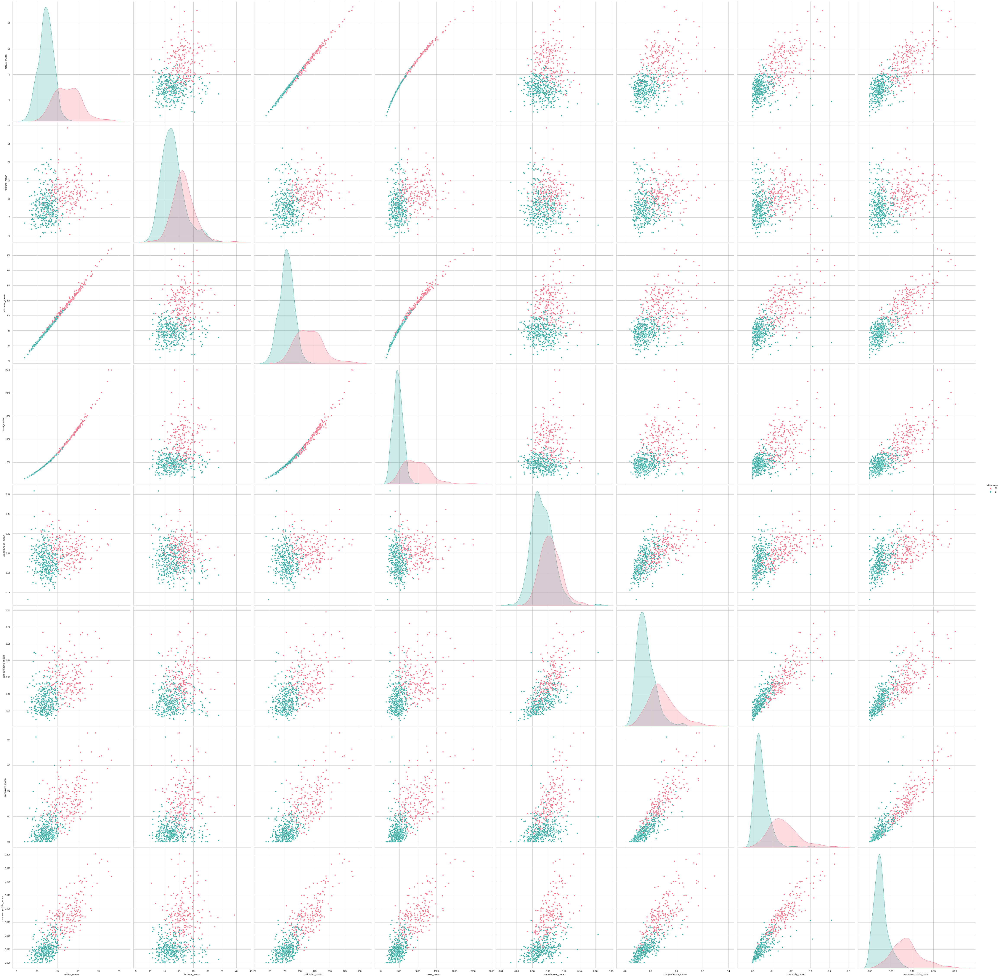

In [385]:
# multivariate analysis
sns.pairplot(df, hue='diagnosis', palette="husl",
            x_vars=['radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean'],
            y_vars=['radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean'], size=8)

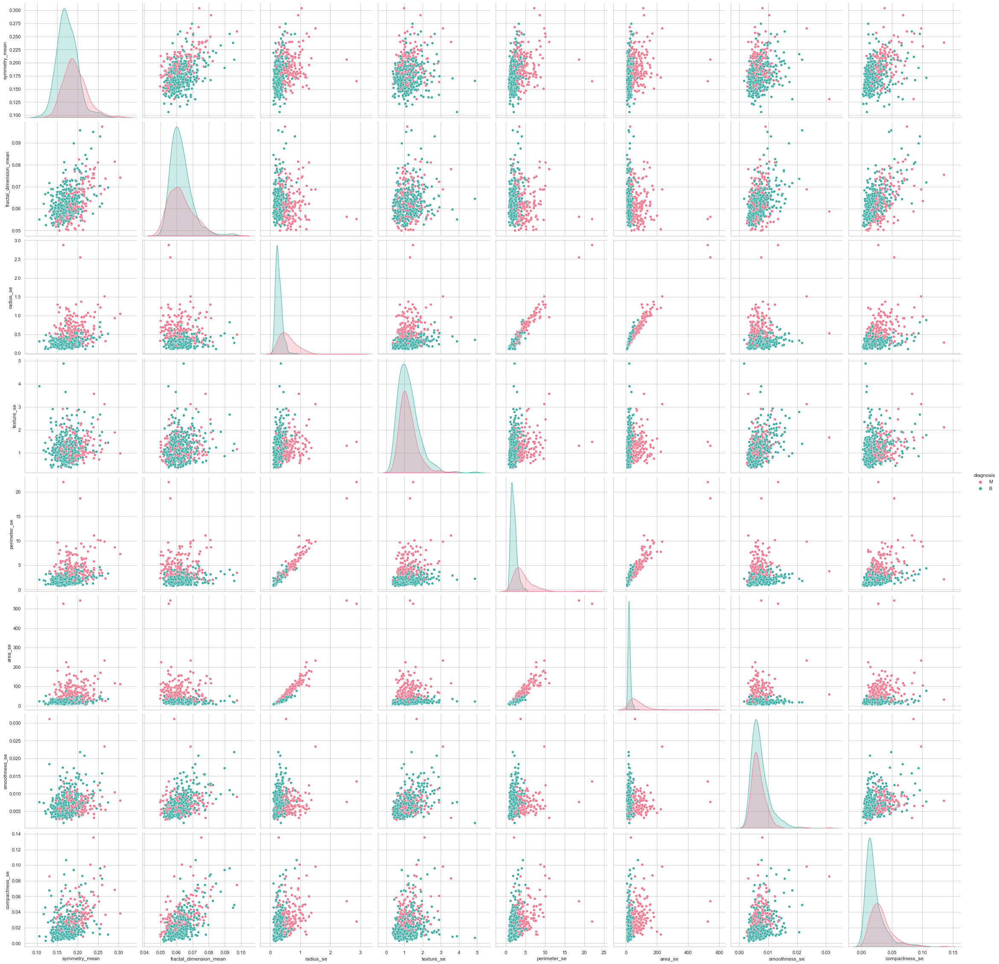

In [386]:
# multivariate analysis
sns.pairplot(df, hue='diagnosis', palette="husl",
            x_vars=['symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se'],
            y_vars=['symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se'], size=4)

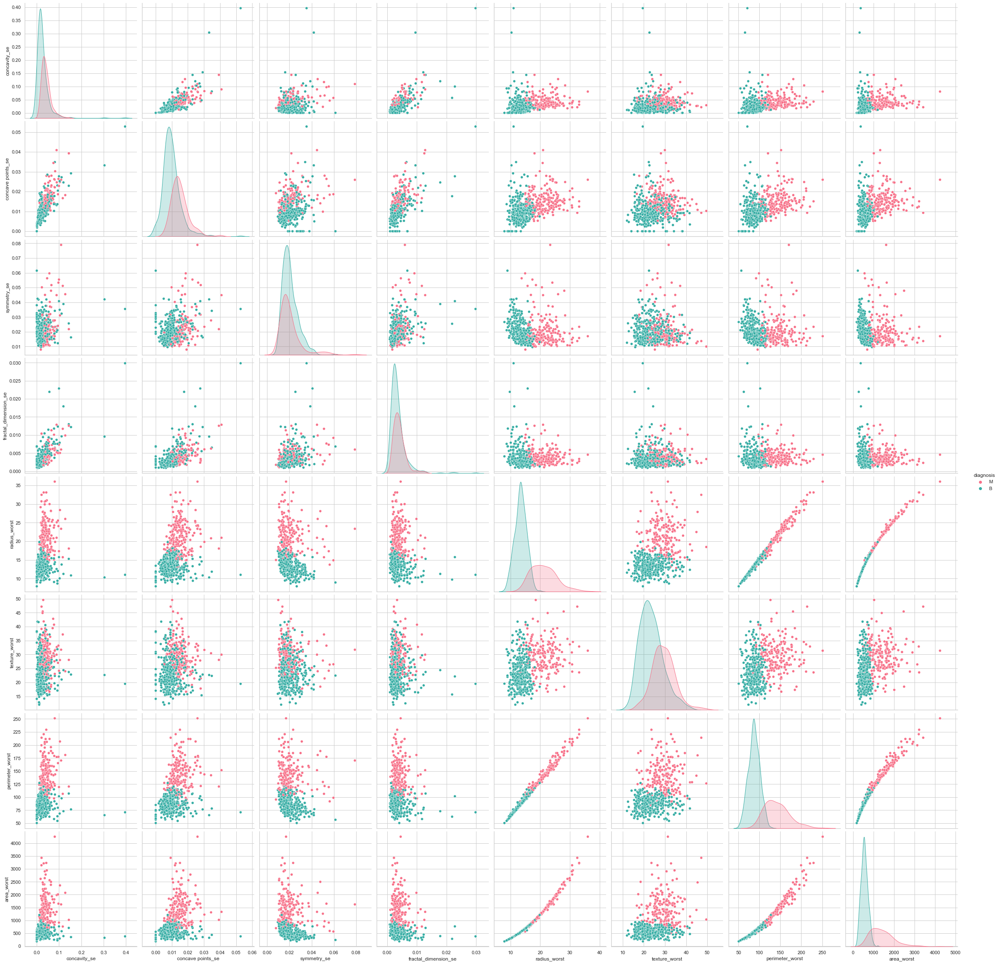

In [387]:
# multivariate analysis
sns.pairplot(df, hue='diagnosis', palette="husl",
            x_vars=['concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst'],
            y_vars=['concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst'], size=4)

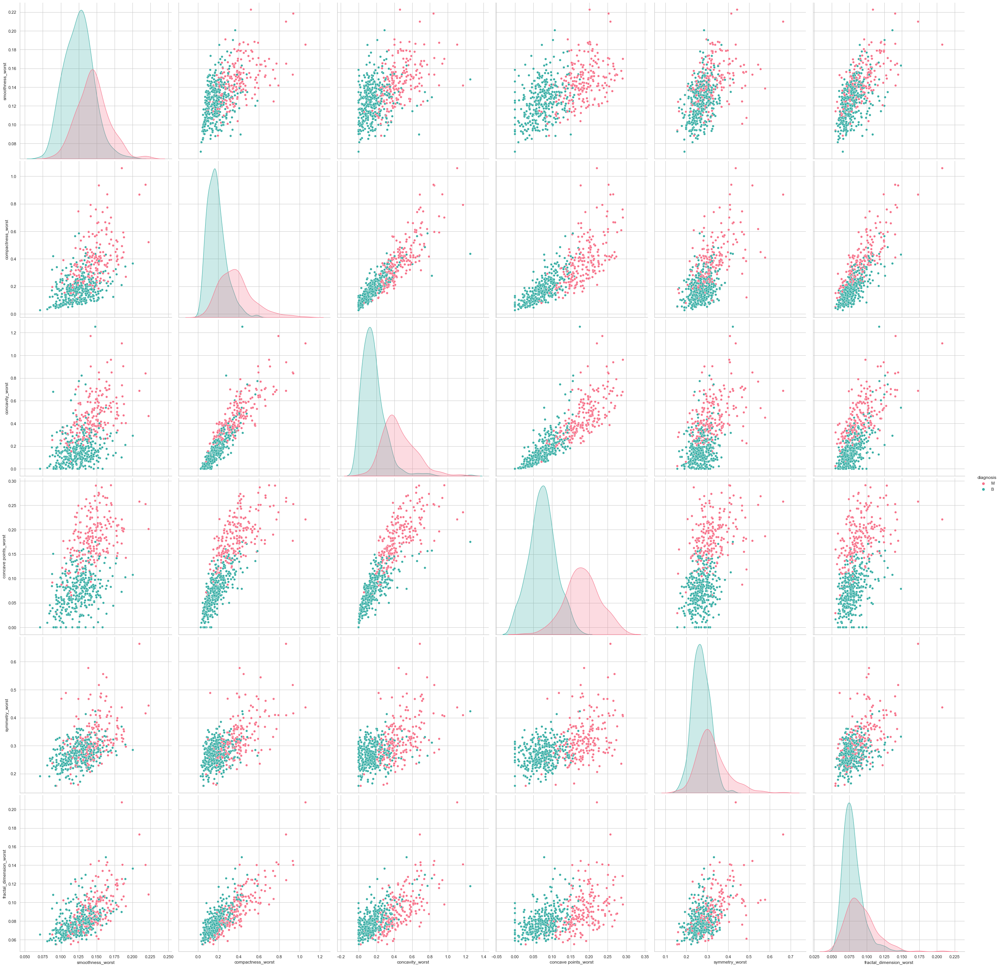

In [388]:
# multivariate analysis
sns.pairplot(df, hue='diagnosis', palette="husl",
            x_vars=['smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
            y_vars=['smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'], size=6)

<AxesSubplot:>

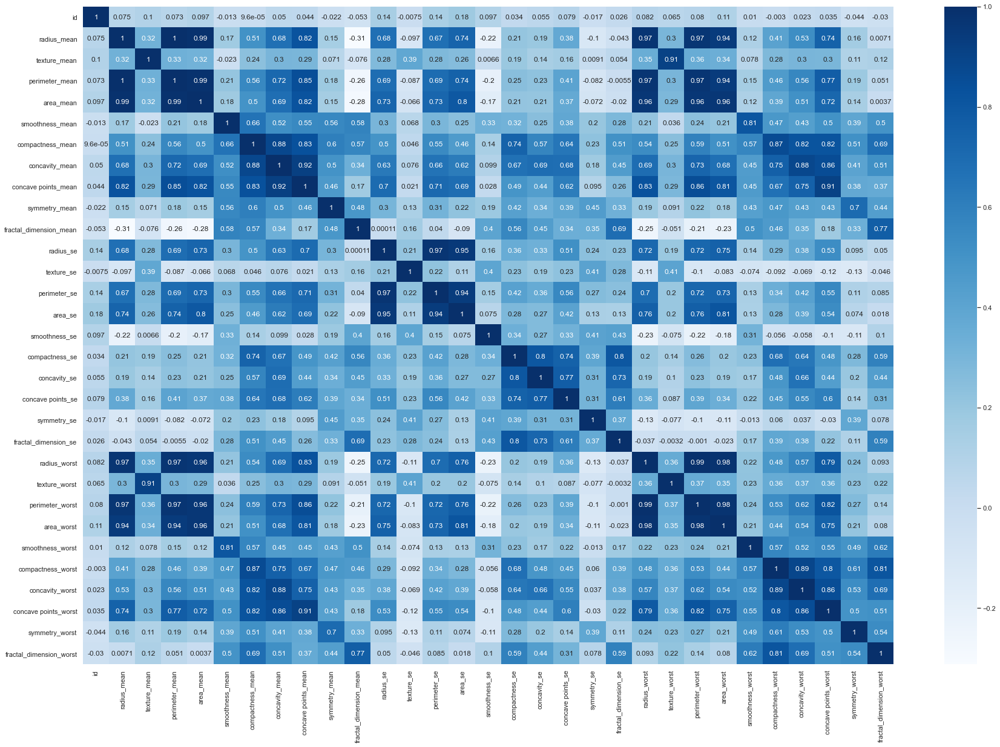

In [577]:
#checking corrleation using heatmap
plt.figure(figsize=(30,20))
sns.heatmap(df.corr(),annot=True,cmap='Blues')

we can see there are many pairs, the correlation is greater than 0.5                
Now identify that pair by this code

In [578]:
import pandas as pd

# Assuming 'df' is your DataFrame
correlation_matrix = df.corr()

# Create a mask to identify pairs with correlation > 0.5
correlation_threshold = 0.5
correlation_mask = (correlation_matrix > correlation_threshold) & (correlation_matrix < 1.0)

# Create a new DataFrame to store correlated pairs and their correlation coefficients
correlation_pairs_df = pd.DataFrame(columns=['column1', 'column2', 'correlation'])

# Iterate through the correlation matrix and populate the correlation_pairs_df DataFrame
for i in correlation_matrix.columns:
    for j in correlation_matrix.columns:
        if i != j and correlation_mask.loc[i, j]:
            correlation_pairs_df = correlation_pairs_df.append({
                'column1': i,
                'column2': j,
                'correlation': correlation_matrix.loc[i, j]
            }, ignore_index=True)

# Remove duplicate rows with reversed pairs
correlation_pairs_df['sorted_columns'] = correlation_pairs_df.apply(lambda row: '-'.join(sorted([row['column1'], row['column2']])), axis=1)
correlation_pairs_df = correlation_pairs_df.drop_duplicates(subset='sorted_columns')

# Drop the 'sorted_columns' column
correlation_pairs_df = correlation_pairs_df[['column1', 'column2', 'correlation']]

# Print or use the correlation_pairs_df DataFrame containing unique correlated pairs and their correlation coefficients
correlation_pairs_df


,column1,column2,correlation
0,radius_mean,perimeter_mean,0.997855
1,radius_mean,area_mean,0.987357
2,radius_mean,compactness_mean,0.506124
3,radius_mean,concavity_mean,0.676764
4,radius_mean,concave points_mean,0.822529
...,...,...,...
253,concavity_worst,symmetry_worst,0.532520
254,concavity_worst,fractal_dimension_worst,0.686511
272,concave points_worst,symmetry_worst,0.502528
273,concave points_worst,fractal_dimension_worst,0.511114


In [579]:
correlation_pairs_df.sort_values(by='correlation', ascending=False)

,column1,column2,correlation
0,radius_mean,perimeter_mean,0.997855
189,radius_worst,perimeter_worst,0.993708
1,radius_mean,area_mean,0.987357
15,perimeter_mean,area_mean,0.986507
190,radius_worst,area_worst,0.984015
...,...,...,...
2,radius_mean,compactness_mean,0.506124
111,fractal_dimension_mean,smoothness_worst,0.504942
45,smoothness_mean,concave points_worst,0.503053
272,concave points_worst,symmetry_worst,0.502528


There are 145 pairs, whose correlation is greater than 0.5. Some of them are about 1. Now we need to find how many pairs there are, whose correlation is 0.90

In [580]:
high_corr_df = correlation_pairs_df[correlation_pairs_df['correlation']>0.90]
high_corr_df

,column1,column2,correlation
0,radius_mean,perimeter_mean,0.997855
1,radius_mean,area_mean,0.987357
8,radius_mean,radius_worst,0.969539
9,radius_mean,perimeter_worst,0.965137
10,radius_mean,area_worst,0.941082
13,texture_mean,texture_worst,0.912045
15,perimeter_mean,area_mean,0.986507
22,perimeter_mean,radius_worst,0.969476
23,perimeter_mean,perimeter_worst,0.970387
24,perimeter_mean,area_worst,0.941550


In [581]:
high_corr_df.shape

(21, 3)

In [582]:
high_corr_df["column1"].value_counts().index

Index(['radius_mean', 'perimeter_mean', 'area_mean', 'radius_se',
       'radius_worst', 'texture_mean', 'perimeter_worst', 'perimeter_se',
       'concave points_mean', 'concavity_mean'],
      dtype='object')

In [583]:
#We remove this columns for high correlation
df_new.drop(['radius_mean', 'perimeter_mean', 'area_mean', 'radius_se',
       'radius_worst', 'texture_mean', 'perimeter_worst', 'perimeter_se',
       'concave points_mean', 'concavity_mean'], axis=1, inplace=True)

In [586]:
#Checking  the correlation again after removing the high correlation

In [584]:
import pandas as pd

# Assuming 'df' is your DataFrame
correlation_matrix = df_new.corr()

# Create a mask to identify pairs with correlation > 0.5
correlation_threshold = 0.5
correlation_mask = (correlation_matrix > correlation_threshold) & (correlation_matrix < 1.0)

# Create a new DataFrame to store correlated pairs and their correlation coefficients
correlation_pairs_df = pd.DataFrame(columns=['column1', 'column2', 'correlation'])

# Iterate through the correlation matrix and populate the correlation_pairs_df DataFrame
for i in correlation_matrix.columns:
    for j in correlation_matrix.columns:
        if i != j and correlation_mask.loc[i, j]:
            correlation_pairs_df = correlation_pairs_df.append({
                'column1': i,
                'column2': j,
                'correlation': correlation_matrix.loc[i, j]
            }, ignore_index=True)

# Remove duplicate rows with reversed pairs
correlation_pairs_df['sorted_columns'] = correlation_pairs_df.apply(lambda row: '-'.join(sorted([row['column1'], row['column2']])), axis=1)
correlation_pairs_df = correlation_pairs_df.drop_duplicates(subset='sorted_columns')

# Drop the 'sorted_columns' column
correlation_pairs_df = correlation_pairs_df[['column1', 'column2', 'correlation']]

# Print or use the correlation_pairs_df DataFrame containing unique correlated pairs and their correlation coefficients
correlation_pairs_df

,column1,column2,correlation
0,smoothness_mean,compactness_mean,0.659123
1,smoothness_mean,symmetry_mean,0.557775
2,smoothness_mean,fractal_dimension_mean,0.584792
3,smoothness_mean,smoothness_worst,0.805324
4,smoothness_mean,concave points_worst,0.503053
6,compactness_mean,symmetry_mean,0.602641
7,compactness_mean,fractal_dimension_mean,0.565369
8,compactness_mean,compactness_se,0.738722
9,compactness_mean,concavity_se,0.570517
10,compactness_mean,concave points_se,0.642262


In [585]:
high_corr_df = correlation_pairs_df[correlation_pairs_df['correlation']>0.90]
high_corr_df

,column1,column2,correlation


In [588]:
# No pairs were found whose correlation approximately 1. Now we can move on to handling outliers

In [589]:
df_new

,diagnosis,smoothness_mean,compactness_mean,symmetry_mean,fractal_dimension_mean,texture_se,area_se,smoothness_se,compactness_se,concavity_se,...,symmetry_se,fractal_dimension_se,texture_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,0.11840,0.27760,0.2419,0.07871,0.9053,153.40,0.006399,0.04904,0.05373,...,0.03003,0.006193,17.33,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,M,0.08474,0.07864,0.1812,0.05667,0.7339,74.08,0.005225,0.01308,0.01860,...,0.01389,0.003532,23.41,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,M,0.10960,0.15990,0.2069,0.05999,0.7869,94.03,0.006150,0.04006,0.03832,...,0.02250,0.004571,25.53,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,M,0.14250,0.28390,0.2597,0.09744,1.1560,27.23,0.009110,0.07458,0.05661,...,0.05963,0.009208,26.50,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,M,0.10030,0.13280,0.1809,0.05883,0.7813,94.44,0.011490,0.02461,0.05688,...,0.01756,0.005115,16.67,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,M,0.11100,0.11590,0.1726,0.05623,1.2560,158.70,0.010300,0.02891,0.05198,...,0.01114,0.004239,26.40,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,M,0.09780,0.10340,0.1752,0.05533,2.4630,99.04,0.005769,0.02423,0.03950,...,0.01898,0.002498,38.25,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,M,0.08455,0.10230,0.1590,0.05648,1.0750,48.55,0.005903,0.03731,0.04730,...,0.01318,0.003892,34.12,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,M,0.11780,0.27700,0.2397,0.07016,1.5950,86.22,0.006522,0.06158,0.07117,...,0.02324,0.006185,39.42,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


# Checking Outliers:

['smoothness_mean', 'compactness_mean', 'symmetry_mean', 'fractal_dimension_mean', 'texture_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'texture_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst']


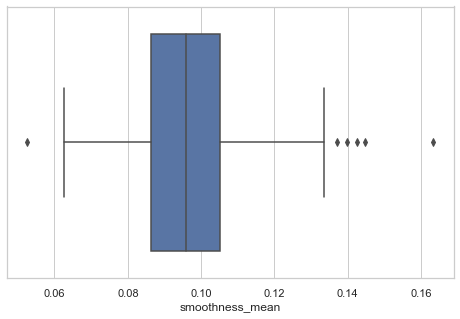



###############################################################################################################################


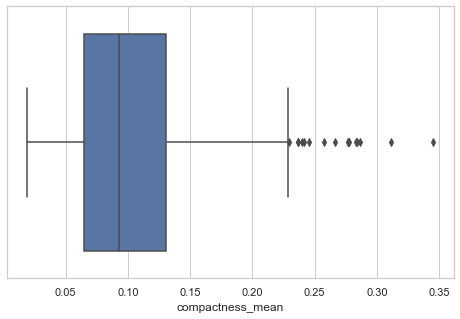



###############################################################################################################################


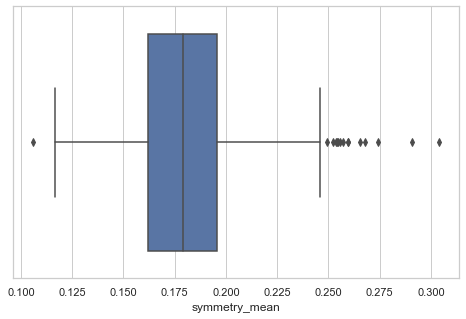



###############################################################################################################################


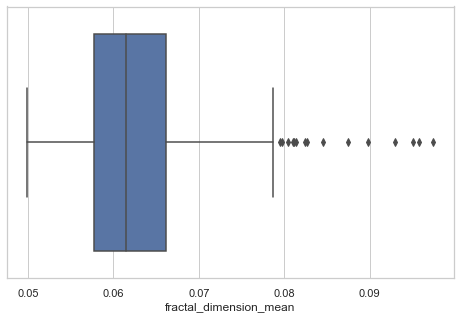



###############################################################################################################################


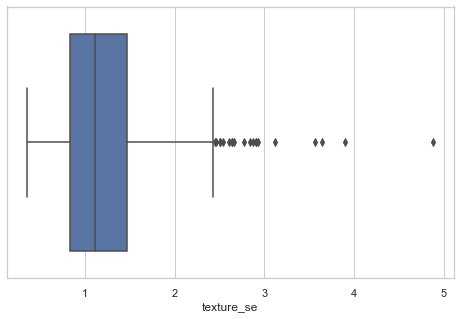



###############################################################################################################################


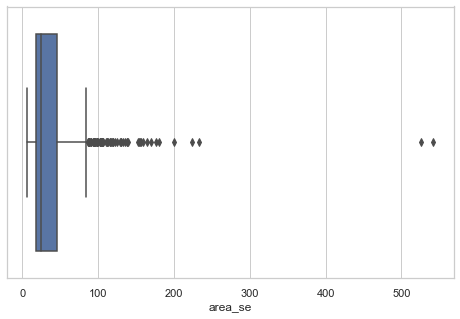



###############################################################################################################################


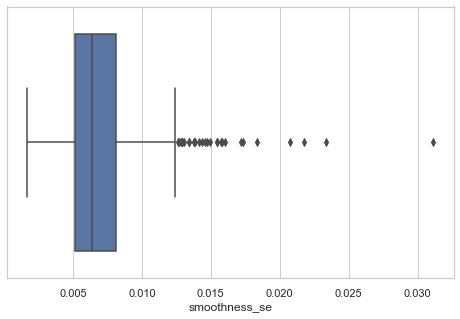



###############################################################################################################################


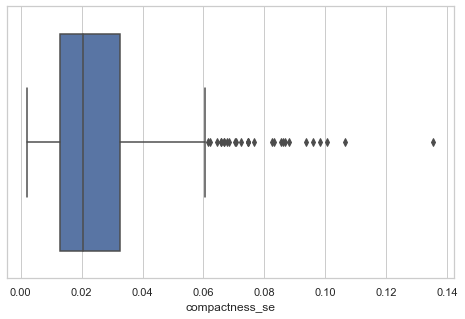



###############################################################################################################################


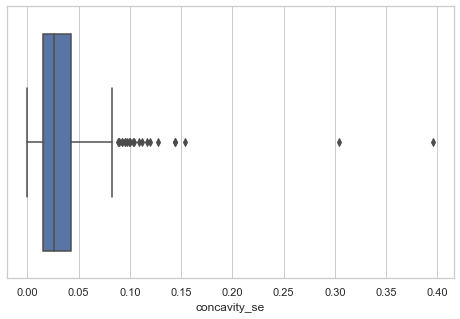



###############################################################################################################################


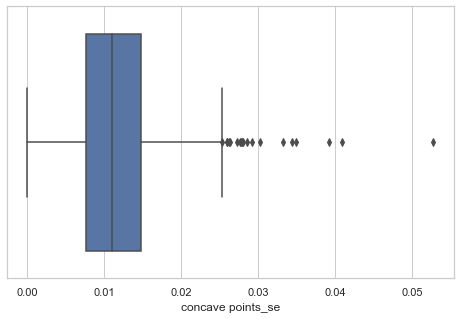



###############################################################################################################################


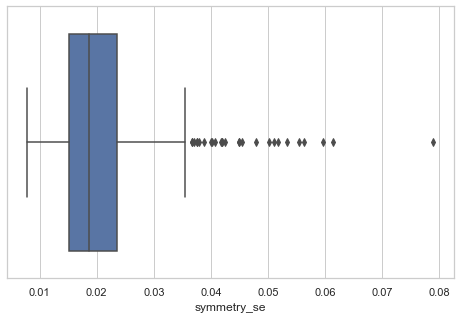



###############################################################################################################################


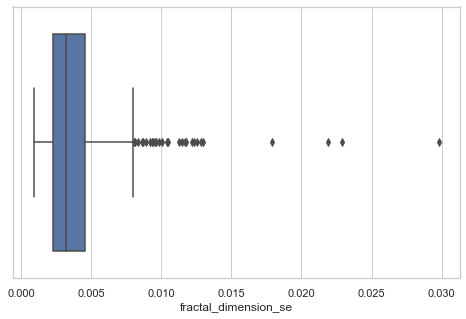



###############################################################################################################################


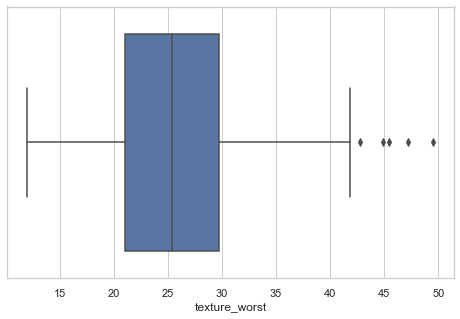



###############################################################################################################################


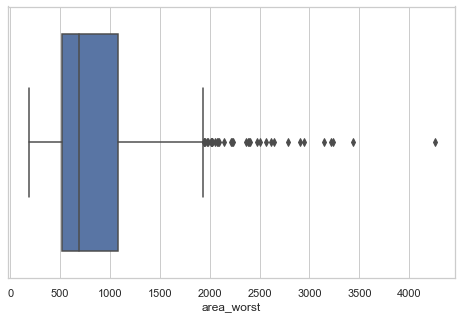



###############################################################################################################################


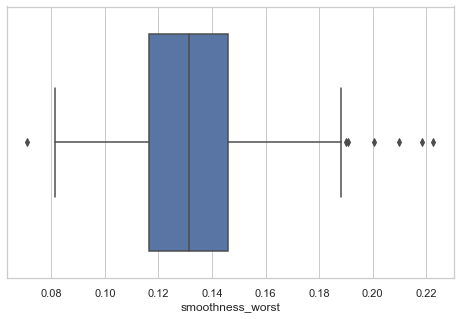



###############################################################################################################################


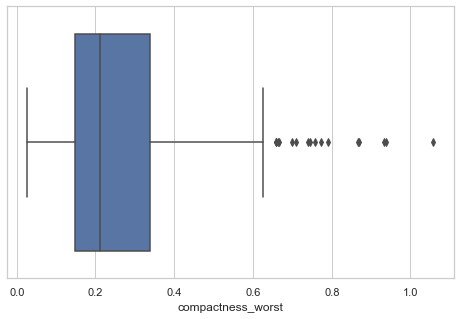



###############################################################################################################################


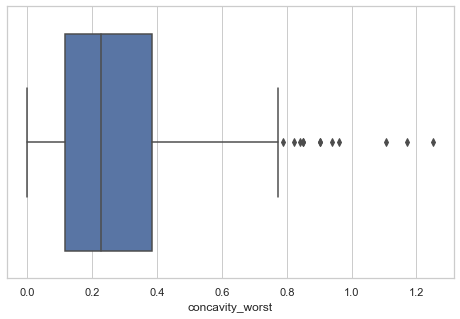



###############################################################################################################################


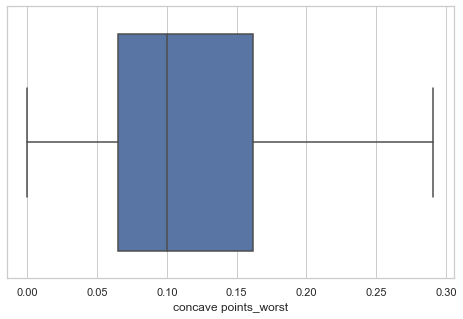



###############################################################################################################################


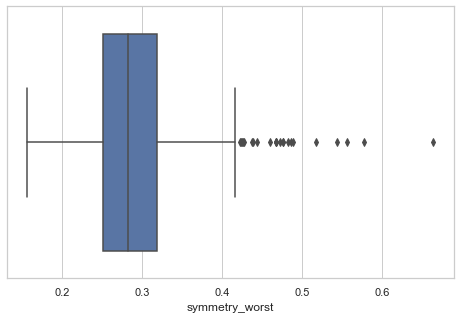



###############################################################################################################################


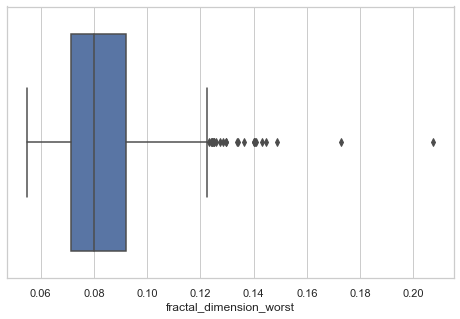



###############################################################################################################################


In [590]:
numerical_columns=[]
index_n=[]
m=0
for i in df_new.dtypes.index:
    if df_new.dtypes[i]!='object':
        numerical_columns.append(i)
        index_n.append(m)
    m=m+1
print(numerical_columns)

for i in numerical_columns:
    plt.figure(figsize=(8,5))
    sns.boxplot(df_new[i])
    plt.show()
    print('\n')
    print("#"*127)

Exists outliers in all numeric columns except "cocave points_worst". We have to handle all outliers

# Outlier Treatment

In [591]:
import pandas as pd
import numpy as np

def replace_outliers_with_whiskers(df, col_name):
    q1 = df[col_name].quantile(0.25)
    q3 = df[col_name].quantile(0.75)
    iqr = q3 - q1  # Interquartile range
    fence_low = q1 - 1.5 * iqr
    fence_high = q3 + 1.5 * iqr

    df[col_name] = np.where(df[col_name] < fence_low, fence_low, df[col_name])
    df[col_name] = np.where(df[col_name] > fence_high, fence_high, df[col_name])

list_out = ['smoothness_mean', 'compactness_mean', 'symmetry_mean', 'fractal_dimension_mean', 'texture_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'texture_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst']

df_no_outliers = df_new.copy()  # Create a copy of the original DataFrame

for var in list_out:
    replace_outliers_with_whiskers(df_no_outliers, var)

# Print the shape of the resulting DataFrame after replacing outliers with whisker values
print(df_no_outliers.shape)


(569, 21)


# checking outliers after treatment

['smoothness_mean', 'compactness_mean', 'symmetry_mean', 'fractal_dimension_mean', 'texture_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'texture_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst']


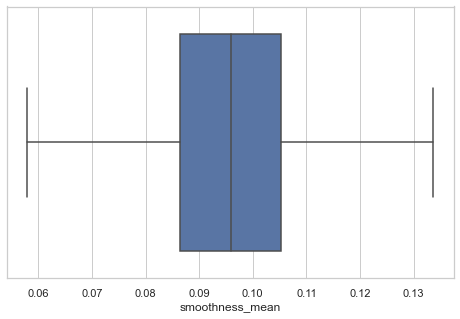



###############################################################################################################################


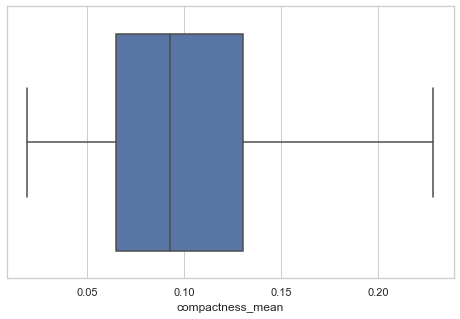



###############################################################################################################################


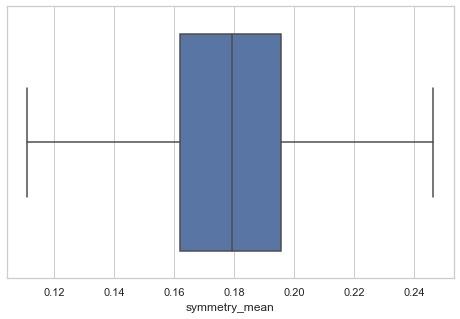



###############################################################################################################################


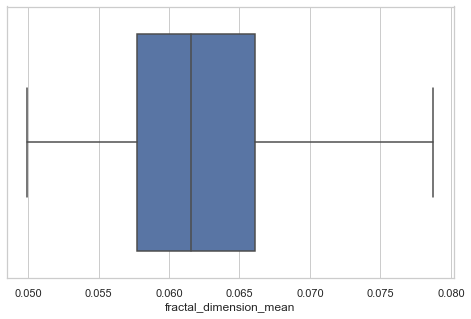



###############################################################################################################################


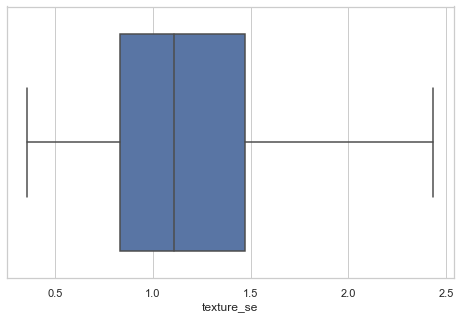



###############################################################################################################################


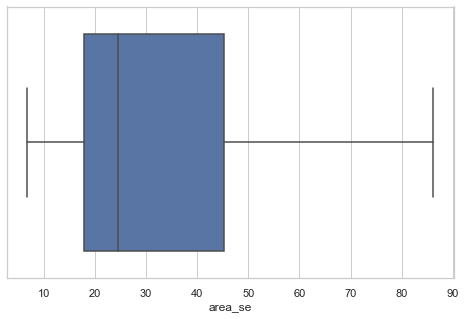



###############################################################################################################################


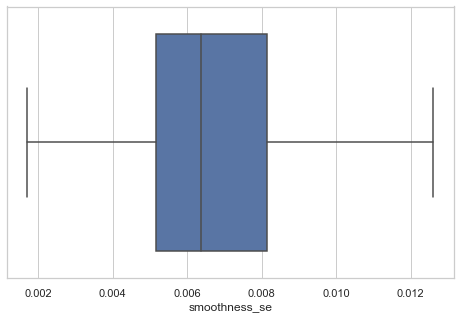



###############################################################################################################################


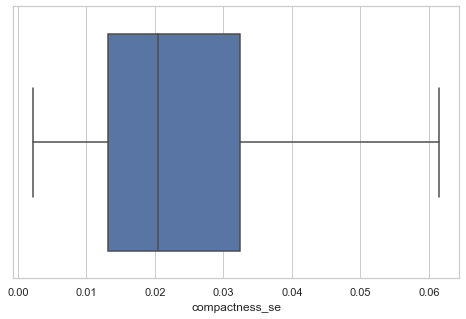



###############################################################################################################################


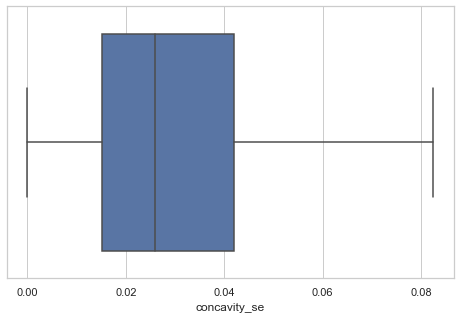



###############################################################################################################################


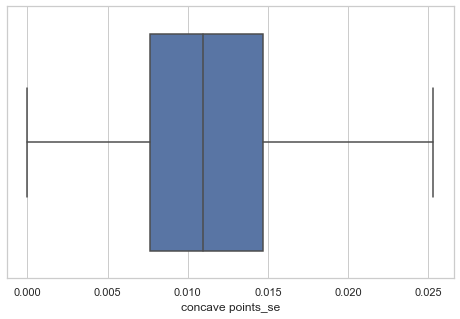



###############################################################################################################################


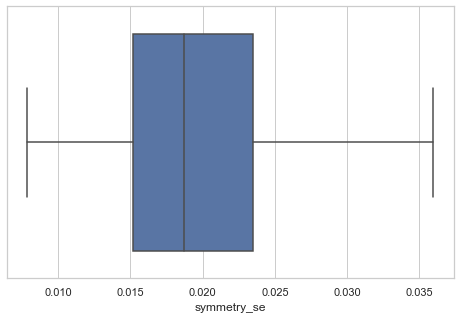



###############################################################################################################################


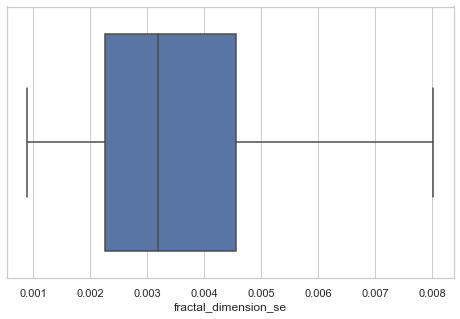



###############################################################################################################################


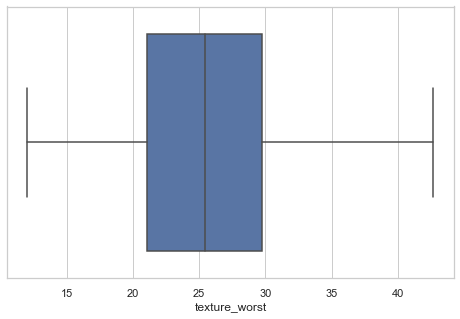



###############################################################################################################################


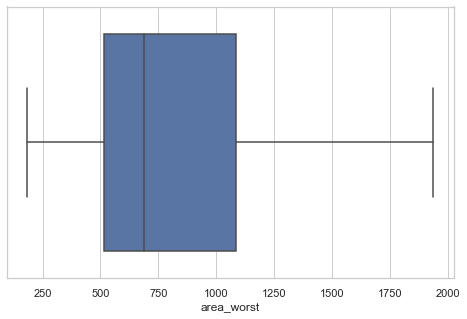



###############################################################################################################################


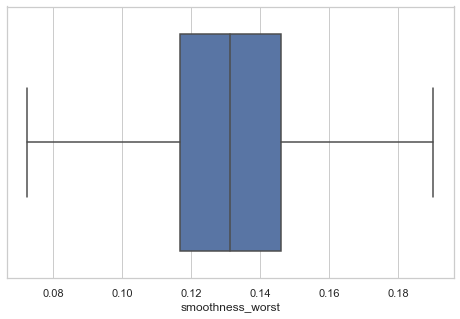



###############################################################################################################################


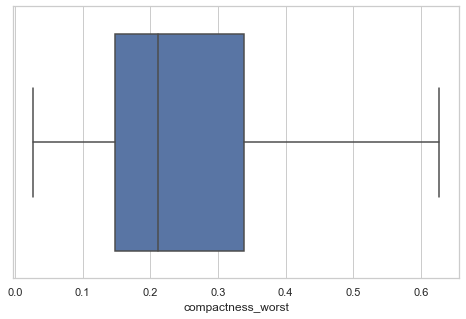



###############################################################################################################################


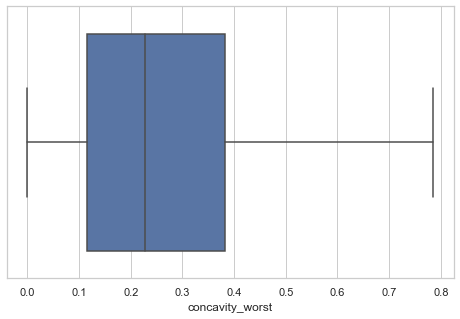



###############################################################################################################################


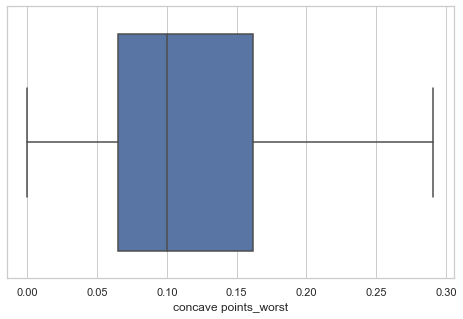



###############################################################################################################################


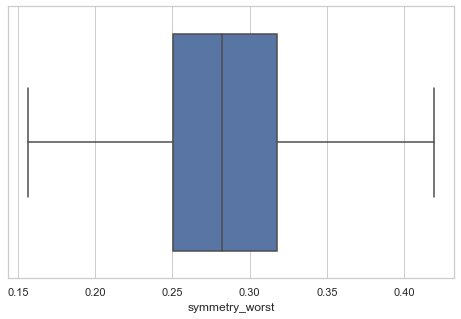



###############################################################################################################################


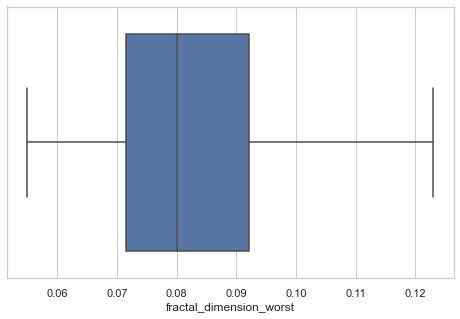



###############################################################################################################################


In [592]:
numerical_columns=[]
index_n=[]
m=0
for i in df_no_outliers.dtypes.index:
    if df_no_outliers.dtypes[i]!='object':
        numerical_columns.append(i)
        index_n.append(m)
    m=m+1
print(numerical_columns)

for i in numerical_columns:
    plt.figure(figsize=(8,5))
    sns.boxplot(df_no_outliers[i])
    plt.show()
    print('\n')
    print("#"*127)

Now there is not outliers in the dataframe

In [593]:
df_no_outliers

,diagnosis,smoothness_mean,compactness_mean,symmetry_mean,fractal_dimension_mean,texture_se,area_se,smoothness_se,compactness_se,concavity_se,...,symmetry_se,fractal_dimension_se,texture_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,0.118400,0.22862,0.2419,0.07871,0.90530,86.20,0.006399,0.049040,0.05373,...,0.03003,0.006193,17.33,1937.05,0.16220,0.62695,0.7119,0.2654,0.41915,0.11890
1,M,0.084740,0.07864,0.1812,0.05667,0.73390,74.08,0.005225,0.013080,0.01860,...,0.01389,0.003532,23.41,1937.05,0.12380,0.18660,0.2416,0.1860,0.27500,0.08902
2,M,0.109600,0.15990,0.2069,0.05999,0.78690,86.20,0.006150,0.040060,0.03832,...,0.02250,0.004571,25.53,1709.00,0.14440,0.42450,0.4504,0.2430,0.36130,0.08758
3,M,0.133695,0.22862,0.2464,0.07875,1.15600,27.23,0.009110,0.061505,0.05661,...,0.03596,0.008023,26.50,567.70,0.19010,0.62695,0.6869,0.2575,0.41915,0.12301
4,M,0.100300,0.13280,0.1809,0.05883,0.78130,86.20,0.011490,0.024610,0.05688,...,0.01756,0.005115,16.67,1575.00,0.13740,0.20500,0.4000,0.1625,0.23640,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,M,0.111000,0.11590,0.1726,0.05623,1.25600,86.20,0.010300,0.028910,0.05198,...,0.01114,0.004239,26.40,1937.05,0.14100,0.21130,0.4107,0.2216,0.20600,0.07115
565,M,0.097800,0.10340,0.1752,0.05533,2.43415,86.20,0.005769,0.024230,0.03950,...,0.01898,0.002498,38.25,1731.00,0.11660,0.19220,0.3215,0.1628,0.25720,0.06637
566,M,0.084550,0.10230,0.1590,0.05648,1.07500,48.55,0.005903,0.037310,0.04730,...,0.01318,0.003892,34.12,1124.00,0.11390,0.30940,0.3403,0.1418,0.22180,0.07820
567,M,0.117800,0.22862,0.2397,0.07016,1.59500,86.20,0.006522,0.061505,0.07117,...,0.02324,0.006185,39.42,1821.00,0.16500,0.62695,0.7855,0.2650,0.40870,0.12301


# Declare feature vector and target variable

In [594]:
X = df_no_outliers.drop(['diagnosis'], axis=1) # Data set of all independet variables

y = df_no_outliers['diagnosis'] # Dataset of target variable

In [595]:
X.head()

,smoothness_mean,compactness_mean,symmetry_mean,fractal_dimension_mean,texture_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,texture_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,0.118400,0.22862,0.2419,0.07871,0.9053,86.20,0.006399,0.049040,0.05373,0.01587,0.03003,0.006193,17.33,1937.05,0.1622,0.62695,0.7119,0.2654,0.41915,0.11890
1,0.084740,0.07864,0.1812,0.05667,0.7339,74.08,0.005225,0.013080,0.01860,0.01340,0.01389,0.003532,23.41,1937.05,0.1238,0.18660,0.2416,0.1860,0.27500,0.08902
2,0.109600,0.15990,0.2069,0.05999,0.7869,86.20,0.006150,0.040060,0.03832,0.02058,0.02250,0.004571,25.53,1709.00,0.1444,0.42450,0.4504,0.2430,0.36130,0.08758
3,0.133695,0.22862,0.2464,0.07875,1.1560,27.23,0.009110,0.061505,0.05661,0.01867,0.03596,0.008023,26.50,567.70,0.1901,0.62695,0.6869,0.2575,0.41915,0.12301
4,0.100300,0.13280,0.1809,0.05883,0.7813,86.20,0.011490,0.024610,0.05688,0.01885,0.01756,0.005115,16.67,1575.00,0.1374,0.20500,0.4000,0.1625,0.23640,0.07678


In [596]:
y.head()

0    M
1    M
2    M
3    M
4    M
Name: diagnosis, dtype: object

# Multicolinearity

In [602]:
# Checking Multicolinearity of Independent Variable

In [603]:
# checking for numerical columns
numerical_columns=[]
for i in X.dtypes.index:
    if X.dtypes[i]!='object':
        numerical_columns.append(i)
print(numerical_columns)

['smoothness_mean', 'compactness_mean', 'symmetry_mean', 'fractal_dimension_mean', 'texture_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'texture_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst']


In [604]:
len(numerical_columns)

20

In [605]:
vif_columns=X[['smoothness_mean', 'compactness_mean', 'symmetry_mean', 'fractal_dimension_mean', 'texture_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'texture_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst']]

In [606]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
#define a function to calculate VIF score
def vif_clac():
    vif=pd.DataFrame()
    vif["VIF Factor"]=[variance_inflation_factor(vif_columns.values,i) for i in range(vif_columns.shape[1])]
    vif["features"]=vif_columns.columns
    print(vif)

In [607]:
#checking VIF score
vif_clac()

    VIF Factor                 features
0   406.016141          smoothness_mean
1    73.829554         compactness_mean
2   200.463340            symmetry_mean
3   575.933013   fractal_dimension_mean
4    26.108264               texture_se
5    32.330074                  area_se
6    45.702175            smoothness_se
7    74.786845           compactness_se
8    52.828108             concavity_se
9    53.573088        concave points_se
10   46.228002              symmetry_se
11   54.983950     fractal_dimension_se
12   54.368944            texture_worst
13   58.099892               area_worst
14  443.412967         smoothness_worst
15  125.216336        compactness_worst
16   66.430976          concavity_worst
17  100.348487     concave points_worst
18  253.383525           symmetry_worst
19  581.743339  fractal_dimension_worst


In [608]:
# Drop high VIF score column
vif_columns=vif_columns.drop("fractal_dimension_worst",axis=1)

In [609]:
#checking VIF score
vif_clac()

    VIF Factor                features
0   373.269340         smoothness_mean
1    71.100866        compactness_mean
2   200.323914           symmetry_mean
3   217.500355  fractal_dimension_mean
4    25.873413              texture_se
5    32.327104                 area_se
6    43.390081           smoothness_se
7    70.137160          compactness_se
8    51.799494            concavity_se
9    53.223921       concave points_se
10   44.697872             symmetry_se
11   25.684930    fractal_dimension_se
12   54.159509           texture_worst
13   58.074961              area_worst
14  404.032001        smoothness_worst
15  102.958363       compactness_worst
16   65.117411         concavity_worst
17  100.177200    concave points_worst
18  250.659182          symmetry_worst


In [610]:
# Drop high VIF score column
vif_columns=vif_columns.drop("smoothness_worst",axis=1)

In [611]:
#checking VIF score
vif_clac()

    VIF Factor                features
0   183.441205         smoothness_mean
1    69.798529        compactness_mean
2   182.697236           symmetry_mean
3   213.382038  fractal_dimension_mean
4    25.255550              texture_se
5    32.252647                 area_se
6    20.237804           smoothness_se
7    69.636262          compactness_se
8    51.775812            concavity_se
9    51.894352       concave points_se
10   36.647039             symmetry_se
11   25.678197    fractal_dimension_se
12   52.347618           texture_worst
13   57.378701              area_worst
14  101.692979       compactness_worst
15   65.041195         concavity_worst
16   96.976177    concave points_worst
17  210.022617          symmetry_worst


In [612]:
# Drop high VIF score column
vif_columns=vif_columns.drop("fractal_dimension_mean",axis=1)
#checking VIF score
vif_clac()

    VIF Factor              features
0   103.597105       smoothness_mean
1    69.010186      compactness_mean
2   173.793481         symmetry_mean
3    24.732330            texture_se
4    30.456369               area_se
5    20.223788         smoothness_se
6    69.632925        compactness_se
7    51.720563          concavity_se
8    51.319356     concave points_se
9    36.597385           symmetry_se
10   21.764076  fractal_dimension_se
11   47.468831         texture_worst
12   55.941813            area_worst
13  100.980651     compactness_worst
14   64.931724       concavity_worst
15   92.225135  concave points_worst
16  209.401812        symmetry_worst


In [613]:
# Drop high VIF score column
vif_columns=vif_columns.drop("symmetry_worst",axis=1)
#checking VIF score
vif_clac()

    VIF Factor              features
0   101.304894       smoothness_mean
1    59.512287      compactness_mean
2    85.483414         symmetry_mean
3    22.200257            texture_se
4    30.266397               area_se
5    19.748968         smoothness_se
6    67.219460        compactness_se
7    51.476703          concavity_se
8    49.795909     concave points_se
9    20.412214           symmetry_se
10   21.761887  fractal_dimension_se
11   43.234346         texture_worst
12   55.893269            area_worst
13   82.919445     compactness_worst
14   64.679854       concavity_worst
15   88.096887  concave points_worst


In [614]:
# Drop high VIF score column
vif_columns=vif_columns.drop("smoothness_mean",axis=1)
#checking VIF score
vif_clac()

    VIF Factor              features
0    52.006143      compactness_mean
1    53.223277         symmetry_mean
2    22.198147            texture_se
3    28.590617               area_se
4    16.135709         smoothness_se
5    62.369036        compactness_se
6    51.469851          concavity_se
7    48.810659     concave points_se
8    20.390931           symmetry_se
9    21.415371  fractal_dimension_se
10   42.514676         texture_worst
11   54.035318            area_worst
12   82.778942     compactness_worst
13   64.407939       concavity_worst
14   88.032138  concave points_worst


In [615]:
# Drop high VIF score column
vif_columns=vif_columns.drop("concave points_worst",axis=1)
#checking VIF score
vif_clac()

    VIF Factor              features
0    47.550872      compactness_mean
1    52.621119         symmetry_mean
2    22.054637            texture_se
3    28.012065               area_se
4    16.124196         smoothness_se
5    60.760448        compactness_se
6    44.305864          concavity_se
7    22.919035     concave points_se
8    20.303262           symmetry_se
9    21.315375  fractal_dimension_se
10   42.404433         texture_worst
11   45.424459            area_worst
12   81.028233     compactness_worst
13   47.390474       concavity_worst


In [616]:
# Drop high VIF score column
vif_columns=vif_columns.drop("compactness_worst",axis=1)
#checking VIF score
vif_clac()

    VIF Factor              features
0    38.673175      compactness_mean
1    52.066599         symmetry_mean
2    20.539460            texture_se
3    27.525067               area_se
4    16.080685         smoothness_se
5    36.607624        compactness_se
6    29.829184          concavity_se
7    22.847215     concave points_se
8    20.225977           symmetry_se
9    21.215069  fractal_dimension_se
10   38.312949         texture_worst
11   45.423385            area_worst
12   22.400739       concavity_worst


As we can see after removing 7 columns, multicollinearity exists. If we remove columns one by one to handle multicollinearity, we will lose huge amounts of data and it may not be possible to predict the target variable from that data. So, we decide that we will stop removing the columns and continue with the next process.

In [617]:
vif_columns.columns

Index(['compactness_mean', 'symmetry_mean', 'texture_se', 'area_se',
       'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se',
       'symmetry_se', 'fractal_dimension_se', 'texture_worst', 'area_worst',
       'concavity_worst'],
      dtype='object')

In [618]:

all_features = ['smoothness_mean', 'compactness_mean', 'symmetry_mean', 'fractal_dimension_mean', 'texture_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'texture_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst']

remaining_features = ['compactness_mean', 'symmetry_mean', 'texture_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'texture_worst', 'area_worst', 'concavity_worst']

# Create a new list of features by subtracting the features to remove from all features
features_to_remove = [feature for feature in all_features if feature not in features_to_remove]

print(features_to_remove)


['smoothness_mean', 'fractal_dimension_mean', 'smoothness_worst', 'compactness_worst', 'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst']


In [619]:
len(features_to_remove)

7

In [620]:
X=X.drop(['smoothness_mean', 'fractal_dimension_mean', 'smoothness_worst', 'compactness_worst', 'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst'],axis=1)

# Transforming data to remove skewness:

In [621]:
#we use power transformation(method= yeo-johnson) method to remove skewness of the columns
from sklearn.preprocessing import power_transform
X=power_transform(X,method='yeo-johnson')
X

array([[ 1.93932441,  2.09827685, -0.52642249, ..., -1.4850287 ,
         0.        ,  1.78895332],
       [-0.39478949,  0.08907479, -1.01264463, ..., -0.2972032 ,
         0.        ,  0.06144106],
       [ 1.19013303,  1.01962361, -0.85467843, ...,  0.06483214,
         0.        ,  1.02004186],
       ...,
       [ 0.17651912, -0.82676149, -0.10692159, ...,  1.34261086,
         0.        ,  0.56622143],
       [ 1.93932441,  2.03615229,  0.90614451, ...,  2.01829734,
         0.        ,  1.9507527 ],
       [-1.47397354, -0.8399238 ,  0.61732116, ...,  0.81714045,
         0.        , -1.80083014]])

In [622]:
#print skewness after power transform
df_new1=pd.DataFrame(X, columns=['compactness_mean', 'symmetry_mean', 'texture_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'texture_worst', 'area_worst', 'concavity_worst'])
df_new1.skew()

compactness_mean        0.102176
symmetry_mean           0.005121
texture_se              0.021078
area_se                 0.056353
smoothness_se           0.075000
compactness_se          0.170630
concavity_se            0.102595
concave points_se       0.006558
symmetry_se             0.109069
fractal_dimension_se    0.151253
texture_worst          -0.008927
area_worst              0.000000
concavity_worst         0.083315
dtype: float64

skewness is under control

In [623]:
#standardizing the data
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
X=sc.fit_transform(X)
X

array([[ 1.93932441,  2.09827685, -0.52642249, ..., -1.4850287 ,
         0.        ,  1.78895332],
       [-0.39478949,  0.08907479, -1.01264463, ..., -0.2972032 ,
         0.        ,  0.06144106],
       [ 1.19013303,  1.01962361, -0.85467843, ...,  0.06483214,
         0.        ,  1.02004186],
       ...,
       [ 0.17651912, -0.82676149, -0.10692159, ...,  1.34261086,
         0.        ,  0.56622143],
       [ 1.93932441,  2.03615229,  0.90614451, ...,  2.01829734,
         0.        ,  1.9507527 ],
       [-1.47397354, -0.8399238 ,  0.61732116, ...,  0.81714045,
         0.        , -1.80083014]])

# Split data into  training and test set

In [624]:
# split X and y into training and testing sets

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 10)

In [625]:
X_train

array([[-1.64453672, -1.79379625, -0.51482837, ..., -0.5052975 ,
         0.        , -1.72153846],
       [-0.34290445,  2.22316183,  0.64088714, ..., -1.45893012,
         0.        , -1.58269578],
       [ 0.3152694 ,  0.09682835, -0.20572905, ...,  1.98673842,
         0.        ,  0.73638426],
       ...,
       [-0.83593048, -0.40447257, -1.82582471, ..., -1.07776469,
         0.        , -0.32031811],
       [-0.88794516, -0.72224985, -0.65892373, ..., -0.2673282 ,
         0.        , -1.04562272],
       [ 0.42717225, -0.07969336,  0.94207281, ...,  2.40173833,
         0.        ,  0.58407637]])

In [626]:
X_train.shape

(426, 13)

In [627]:
X_test

array([[ 1.12770379,  0.66210296, -1.25124102, ..., -1.54862897,
         0.        ,  1.45391937],
       [-1.05428479, -0.39203351,  1.33709317, ..., -0.01520068,
         0.        , -1.05582142],
       [-0.81575179,  0.31804399, -1.78435426, ..., -0.89079379,
         0.        , -0.62831823],
       ...,
       [-0.61151592, -0.9016394 , -1.21873165, ..., -0.82661699,
         0.        , -0.72173663],
       [-1.1624417 , -0.42941256, -1.51801489, ..., -1.92336098,
         0.        , -0.76114546],
       [ 0.43114981,  0.04627854, -0.65892373, ...,  0.49445182,
         0.        ,  0.80329108]])

In [628]:
X_test.shape

(143, 13)

In [629]:
y_train

327    B
60     B
260    M
504    B
544    B
      ..
369    M
320    B
527    B
125    B
265    M
Name: diagnosis, Length: 426, dtype: object

In [630]:
y_test

172    M
553    B
374    B
370    M
419    B
      ..
545    B
161    M
434    B
59     B
164    M
Name: diagnosis, Length: 143, dtype: object

In [631]:
lg=LogisticRegression()
gnb=GaussianNB()
svc=SVC()
dtc=DecisionTreeClassifier()
knn=KNeighborsClassifier()

#creat a list of all above model
model_list=[lg,gnb,svc,dtc,knn]

In [632]:
for model in model_list:
    model.fit(X_train,y_train)
    predm=model.predict(X_test)
    print('Accuracy score of ',model,'is')
    print(accuracy_score(y_test,predm))
    print(confusion_matrix(y_test,predm))
    print(classification_report(y_test,predm))
    print('*'*125)
    print('_'*125)
    print("\n")

Accuracy score of  LogisticRegression() is
0.958041958041958
[[86  5]
 [ 1 51]]
              precision    recall  f1-score   support

           B       0.99      0.95      0.97        91
           M       0.91      0.98      0.94        52

    accuracy                           0.96       143
   macro avg       0.95      0.96      0.96       143
weighted avg       0.96      0.96      0.96       143

*****************************************************************************************************************************
_____________________________________________________________________________________________________________________________


Accuracy score of  GaussianNB() is
0.9090909090909091
[[82  9]
 [ 4 48]]
              precision    recall  f1-score   support

           B       0.95      0.90      0.93        91
           M       0.84      0.92      0.88        52

    accuracy                           0.91       143
   macro avg       0.90      0.91      0.90     

In [633]:
for model in model_list:
    scr=cross_val_score(model,X,y,cv=5)
    print("cross validation score of",model,"is =",scr.mean())
    print("\n")
    print('-'*125)
    print("\n")

cross validation score of LogisticRegression() is = 0.9666200900481291


-----------------------------------------------------------------------------------------------------------------------------


cross validation score of GaussianNB() is = 0.8682192206179165


-----------------------------------------------------------------------------------------------------------------------------


cross validation score of SVC() is = 0.9595870206489675


-----------------------------------------------------------------------------------------------------------------------------


cross validation score of DecisionTreeClassifier() is = 0.9033845676137247


-----------------------------------------------------------------------------------------------------------------------------


cross validation score of KNeighborsClassifier() is = 0.9455053563111319


-----------------------------------------------------------------------------------------------------------------------------




# Parameter Tuning for LogisticRegression

In [651]:
#creating parameter list to pass in GreadSearchCV
parameters = {
    'penalty': ['l1', 'l2', 'elasticnet', 'none'],
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
    'multi_class': ['auto', 'ovr', 'multinomial'],
    'C': [0.001, 0.01, 0.1, 1, 10],  # Regularization parameter
    'max_iter': [100, 200, 300]  # Maximum number of iterations
}
log_r=GridSearchCV(LogisticRegression(),parameters,cv=5,scoring='accuracy')
log_r.fit(X_train,y_train)
log_r.best_params_

{'C': 1,
 'max_iter': 100,
 'multi_class': 'auto',
 'penalty': 'l2',
 'solver': 'newton-cg'}

In [652]:
log_r.best_score_

0.9717920656634748

Accuracy: 0.96
Sensitivity: 0.98
Specificity: 0.95


              Confusion Matrix
              _________________


<AxesSubplot:>

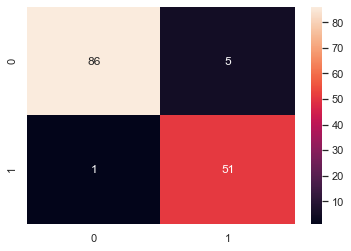

In [653]:
from sklearn.metrics import confusion_matrix, accuracy_score

predm1=log_r.predict(X_test)
conf_matrix = confusion_matrix(y_test,predm1)
accuracy = accuracy_score(y_test,predm1)

# Calculate sensitivity and specificity
TN, FP, FN, TP = conf_matrix.ravel()
sensitivity = TP / (TP + FN)
specificity = TN / (TN + FP)

print(f'Accuracy: {accuracy:.2f}')
print(f'Sensitivity: {sensitivity:.2f}')
print(f'Specificity: {specificity:.2f}')
print('\n')
print("              Confusion Matrix")
print("              _________________")
confusion_matrix(y_test,predm1)
sns.heatmap(confusion_matrix(y_test,predm1),annot=True, fmt='d')

# Parameter Tuning for GaussianNB

In [ ]:
#GaussianNB does not have traditional hyperparameters

# Parameter Tuning for SVC

#creating parameter list to pass in GreadSearchCV
parameters = {
    'C': [0.1, 1, 10],
    'gamma': [0.01, 0.1, 1],
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
    'degree': [2, 3, 4],  # Only for the 'poly' kernel
    'coef0': [0.0, 1.0, 2.0],  # Only for the 'poly' and 'sigmoid' kernels
    'shrinking': [True, False],
    'probability': [True, False],
    'tol': [1e-3, 1e-4, 1e-5],
    'class_weight': [None, 'balanced'],
    
}
svc=GridSearchCV(SVC(),parameters,cv=5,scoring='accuracy')
svc.fit(X_train,y_train)
svc.best_params_

In [640]:
#creating parameter list to pass in GreadSearchCV
parameters = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf'],
    'degree': [2, 3],  # Only for the 'poly' kernel
    'shrinking': [True, False],
}
svc=GridSearchCV(SVC(),parameters,cv=5,scoring='accuracy')
svc.fit(X_train,y_train)
svc.best_params_

{'C': 0.1, 'degree': 2, 'kernel': 'linear', 'shrinking': True}

In [641]:
svc.best_score_

0.9694664842681258

Accuracy: 0.96
Sensitivity: 0.96
Specificity: 0.96


              Confusion Matrix
              _________________


<AxesSubplot:>

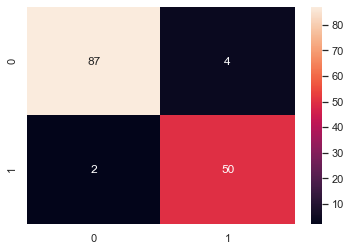

In [642]:
from sklearn.metrics import confusion_matrix, accuracy_score

predm1=svc.predict(X_test)
conf_matrix = confusion_matrix(y_test,predm1)
accuracy = accuracy_score(y_test,predm1)

# Calculate sensitivity and specificity
TN, FP, FN, TP = conf_matrix.ravel()
sensitivity = TP / (TP + FN)
specificity = TN / (TN + FP)

print(f'Accuracy: {accuracy:.2f}')
print(f'Sensitivity: {sensitivity:.2f}')
print(f'Specificity: {specificity:.2f}')
print('\n')
print("              Confusion Matrix")
print("              _________________")
confusion_matrix(y_test,predm1)
sns.heatmap(confusion_matrix(y_test,predm1),annot=True, fmt='d')

# Parameter Tuning for DecisionTreeClassifier

In [643]:
#creating parameter list to pass in GreadSearchCV
parameters = {
    'max_depth': [None, 10, 20, 30],  # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 4],  # Minimum number of samples required to be at a leaf node
    'max_features': ['auto', 'sqrt', 'log2'],  # Number of features to consider when looking for the best split
    'criterion': ['gini', 'entropy']  # Function to measure the quality of a split
}
dtc=GridSearchCV(DecisionTreeClassifier(),parameters,cv=5,scoring='accuracy')
dtc.fit(X_train,y_train)
dtc.best_params_

{'criterion': 'entropy',
 'max_depth': 10,
 'max_features': 'auto',
 'min_samples_leaf': 4,
 'min_samples_split': 2}

In [644]:
dtc.best_score_

0.9273324213406292

Accuracy: 0.90
Sensitivity: 0.81
Specificity: 0.95


              Confusion Matrix
              _________________


<AxesSubplot:>

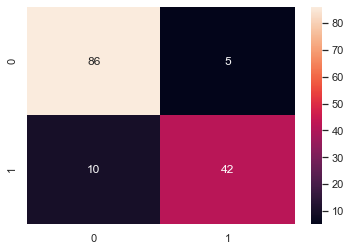

In [645]:
from sklearn.metrics import confusion_matrix, accuracy_score

predm1=dtc.predict(X_test)
conf_matrix = confusion_matrix(y_test,predm1)
accuracy = accuracy_score(y_test,predm1)

# Calculate sensitivity and specificity
TN, FP, FN, TP = conf_matrix.ravel()
sensitivity = TP / (TP + FN)
specificity = TN / (TN + FP)

print(f'Accuracy: {accuracy:.2f}')
print(f'Sensitivity: {sensitivity:.2f}')
print(f'Specificity: {specificity:.2f}')
print('\n')
print("              Confusion Matrix")
print("              _________________")
confusion_matrix(y_test,predm1)
sns.heatmap(confusion_matrix(y_test,predm1),annot=True, fmt='d')

# Parameter Tuning for KNeighborsClassifier

In [646]:
#creating parameter list to pass in GreadSearchCV
parameters = {
    'n_neighbors': [3, 5, 7],          # Number of neighbors to consider
    'weights': ['uniform', 'distance'], # Weight function used in prediction ('uniform' or 'distance')
    'metric': ['euclidean', 'manhattan', 'minkowski'],  # Distance metric for calculating neighbors
    'leaf_size': [10, 20, 30],         # Leaf size for tree-based search (BallTree or KDTree)
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],  # Algorithm for nearest neighbors search
    'p': [1, 2],                       # Power parameter for the Minkowski metric (1 for Manhattan, 2 for Euclidean)
}
knc=GridSearchCV(KNeighborsClassifier(),parameters,cv=5,scoring='accuracy')
knc.fit(X_train,y_train)
knc.best_params_

{'algorithm': 'auto',
 'leaf_size': 10,
 'metric': 'euclidean',
 'n_neighbors': 7,
 'p': 1,
 'weights': 'uniform'}

In [647]:
knc.best_score_

0.9460191518467853

Accuracy: 0.94
Sensitivity: 0.94
Specificity: 0.95


              Confusion Matrix
              _________________


<AxesSubplot:>

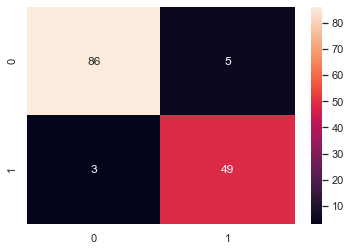

In [648]:
from sklearn.metrics import confusion_matrix, accuracy_score

predm1=knc.predict(X_test)
conf_matrix = confusion_matrix(y_test,predm1)
accuracy = accuracy_score(y_test,predm1)

# Calculate sensitivity and specificity
TN, FP, FN, TP = conf_matrix.ravel()
sensitivity = TP / (TP + FN)
specificity = TN / (TN + FP)

print(f'Accuracy: {accuracy:.2f}')
print(f'Sensitivity: {sensitivity:.2f}')
print(f'Specificity: {specificity:.2f}')
print('\n')
print("              Confusion Matrix")
print("              _________________")
confusion_matrix(y_test,predm1)
sns.heatmap(confusion_matrix(y_test,predm1),annot=True, fmt='d')

# Final model selection:

In [649]:
#Since LogisticRegression and dtc give more than 95% accuracy, we will select our final model After checking the cross val score of both

In [664]:
model_list=[log_r.best_estimator_, svc.best_estimator_]

for i in range(2,10):
    print("For CV =",i)
    print("***********")
    for model in model_list:
        scr=cross_val_score(model,X,y,cv=i)
        print("cross validation score of",model,"is =",scr.mean())
    print("\n")
    print('-'*125)
    print("\n")

For CV = 2
***********
cross validation score of LogisticRegression(C=1, solver='newton-cg') is = 0.9666048925129727
cross validation score of SVC(C=0.1, degree=2, kernel='linear') is = 0.9648566839634297


-----------------------------------------------------------------------------------------------------------------------------


For CV = 3
***********
cross validation score of LogisticRegression(C=1, solver='newton-cg') is = 0.9630743525480367
cross validation score of SVC(C=0.1, degree=2, kernel='linear') is = 0.9525387542931402


-----------------------------------------------------------------------------------------------------------------------------


For CV = 4
***********
cross validation score of LogisticRegression(C=1, solver='newton-cg') is = 0.9613291637939525
cross validation score of SVC(C=0.1, degree=2, kernel='linear') is = 0.9525509701566038


---------------------------------------------------------------------------------------------------------------------------

In [665]:
# We can see the accuracy score of Logistic Regression alaways more than SVC. So, our final model is logistic regration.

In [666]:
final_model=log_r.best_estimator_

In [667]:
final_model.fit(X_train,y_train)
predm1=final_model.predict(X_test)
predm2=final_model.predict(X_train)
print('Test Accuracy score of final model =',accuracy_score(y_test,predm1))
print('Train Accuracy score of final model =',accuracy_score(y_train,predm2))
print(confusion_matrix(y_test,predm1))
print(classification_report(y_test,predm1))

Test Accuracy score of final model = 0.958041958041958
Train Accuracy score of final model = 0.9835680751173709
[[86  5]
 [ 1 51]]
              precision    recall  f1-score   support

           B       0.99      0.95      0.97        91
           M       0.91      0.98      0.94        52

    accuracy                           0.96       143
   macro avg       0.95      0.96      0.96       143
weighted avg       0.96      0.96      0.96       143



<AxesSubplot:>

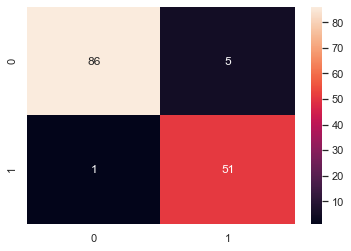

In [668]:
confusion_matrix(y_test,predm1)
sns.heatmap(confusion_matrix(y_test,predm1),annot=True, fmt='d')

In [669]:
from sklearn.metrics import confusion_matrix, accuracy_score

conf_matrix = confusion_matrix(y_test,predm1)
accuracy = accuracy_score(y_test,predm1)

# Calculate sensitivity and specificity
TN, FP, FN, TP = conf_matrix.ravel()
sensitivity = TP / (TP + FN)
specificity = TN / (TN + FP)

print(f'Accuracy: {accuracy:.2f}')
print(f'Sensitivity: {sensitivity:.2f}')
print(f'Specificity: {specificity:.2f}')

Accuracy: 0.96
Sensitivity: 0.98
Specificity: 0.95


# ROCAUC curve:

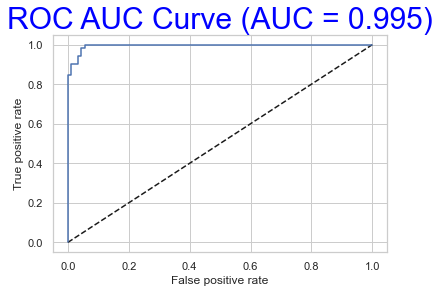

In [670]:
from sklearn.metrics import roc_curve, roc_auc_score

# Assuming final_model is a trained classifier
y_pred_prob = final_model.predict_proba(X_test)[:, 1]

# Convert 'B' to 0 and 'M' to 1 for y_test
y_test_binary = np.where(y_test == 'B', 0, 1)

# Compute the ROC curve and ROC-AUC score
fpr, tpr, thresholds = roc_curve(y_test_binary, y_pred_prob)
auc_score = roc_auc_score(y_test_binary, y_pred_prob)

# Plot the ROC curve and display the AUC score
import matplotlib.pyplot as plt
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr)
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC AUC Curve (AUC = {:.3f})'.format(auc_score), color='Blue', size=30)
plt.show()


In [671]:
MLdf=pd.DataFrame([final_model.predict(X_test)[:],y_test[:]],index=["Predicted","Original"]).T
MLdf

,Predicted,Original
0,M,M
1,B,B
2,B,B
3,M,M
4,B,B
...,...,...
138,B,B
139,M,M
140,B,B
141,B,B


In [672]:
MLdf=pd.DataFrame([final_model.predict(X_train)[:],y_train[:]],index=["Predicted","Original"]).T
MLdf

,Predicted,Original
0,B,B
1,B,B
2,M,M
3,B,B
4,B,B
...,...,...
421,M,M
422,B,B
423,B,B
424,B,B


# -----------------------------------------THANK YOU---------------------------------------------------